In [ ]:
import torch
import torch.nn as nn
import numpy as np
from tqdm import tqdm
import torch.optim.lr_scheduler as lr_scheduler

# This is inspired by Kolmogorov-Arnold Networks but using Chebyshev polynomials instead of splines coefficients
# https://github.com/Ali-Meh619/FKAN
class FourierKANLayer(nn.Module):
    def __init__(self, input_dim, output_dim, gridsize,addbias=True,smooth_initialization=False):
        super(FourierKANLayer, self).__init__()
        self.gridsize= gridsize
        self.addbias = addbias
        self.inputdim = input_dim
        self.outdim = output_dim
        grid_norm_factor = (torch.arange(gridsize) + 1)**2 if smooth_initialization else np.sqrt(gridsize)
        self.fouriercoeffs = torch.nn.Parameter( torch.randn(2,output_dim,input_dim,gridsize) /
                                                (np.sqrt(input_dim) * grid_norm_factor ) )
        if(self.addbias):
            self.bias  = torch.nn.Parameter( torch.zeros(1,output_dim))

    def forward(self, x):
        xshp = x.shape
        outshape = xshp[0:-1]+(self.outdim,)
        x = torch.reshape(x,(-1,self.inputdim))
        k = torch.reshape( torch.arange(1,self.gridsize+1,device=x.device),(1,1,1,self.gridsize))
        xrshp = torch.reshape(x,(x.shape[0],1,x.shape[1],1) )
        c = torch.cos( k*xrshp )
        s = torch.sin( k*xrshp )
        y =  torch.sum( c*self.fouriercoeffs[0:1],(-2,-1))
        y += torch.sum( s*self.fouriercoeffs[1:2],(-2,-1))
        if( self.addbias):
            y += self.bias
        y = torch.reshape( y, outshape)
        return y


class SineLayer(nn.Module):
    '''
    SineLayer is a custom PyTorch module that applies the Sinusoidal activation function to the output of a linear transformation.

    Args:
        in_features (int): Number of input features.
        out_features (int): Number of output features.
        bias (bool, optional): If True, the linear transformation includes a bias term. Default is True.
        is_first (bool, optional): If it is the first layer, we initialize the weights differently. Default is False.
        omega_0 (float, optional): Frequency scaling factor for the sinusoidal activation. Default is 30.
        scale (float, optional): Scaling factor for the output of the sine activation. Default is 10.0.
        init_weights (bool, optional): If True, initializes the layer's weights according to the SIREN paper. Default is True.

    '''
    def __init__(self, in_features, out_features, bias=True,
                 is_first=False, omega_0=30, scale=10.0,init_weights=True):
        super().__init__()
        self.omega_0 = omega_0
        self.is_first = is_first
        self.in_features = in_features
        self.a=nn.Parameter(torch.tensor(1.))
        self.b=nn.Parameter(torch.tensor(30.))
        self.c=nn.Parameter(torch.tensor(1.))
        self.linear = nn.Linear(in_features, out_features, bias=bias)
        self.init_weights()

    def init_weights(self):
        with torch.no_grad():
            if self.is_first:
                self.linear.weight.uniform_(-1 / self.in_features,
                                             1 / self.in_features)
            else:
                self.linear.weight.uniform_(-np.sqrt(6 / self.in_features) / self.omega_0,
                                             np.sqrt(6 / self.in_features) / self.omega_0)

    def forward(self, input):
        return (self.linear(input)+torch.tanh(self.omega_0*self.linear(input)))*nn.Sigmoid()(self.linear(input))

class FKANLayer(nn.Module):
    def __init__(self, in_features, out_features, grid):
        super(FKANLayer, self).__init__()
        self.fkan = FourierKANLayer(in_features, out_features, grid)
        self.norm = nn.LayerNorm(out_features)

    def forward(self, x):
        x = self.fkan(x)
        x = self.norm(x)
        return x

class ReLULayer(nn.Module):
    def __init__(self, in_features, out_features, bias=True):
        super(ReLULayer, self).__init__()
        self.linear = nn.Linear(in_features, out_features, bias=bias)

    def forward(self, input):
        return nn.functional.relu(self.linear(input))



class FKAN_INR(nn.Module):
    def __init__(self, in_features, hidden_features, out_features,grid):
        super(FKAN_INR, self).__init__()
        self.fkan=FKANLayer(in_features, hidden_features,grid)
        self.hid1=SineLayer(hidden_features,2*hidden_features)
        self.hid2=SineLayer(2*hidden_features,2*hidden_features)
        self.hid3=SineLayer(2*hidden_features,2*hidden_features)
        self.hid4=SineLayer(2*hidden_features,4*hidden_features)
        self.out=nn.Linear(4*hidden_features,out_features)
        with torch.no_grad():
            const = np.sqrt(6/hidden_features)/30
            self.out.weight.uniform_(-const, const)

    def forward(self, coords):
        x=self.fkan(coords)
        y1=self.hid1(x)
        y2=self.hid2(y1)
        y3=self.hid3(y2)
        y4=self.hid4(y3)
        y4=self.out(y4)
        return y4

class AdaptiveGridFKAN(nn.Module):
    def __init__(self, in_dim=1, hidden=256, out_dim=1,
                 base_grid=1024, learnable_dims='per_dim'):
        super().__init__()
        self.fkan = FKAN_INR(in_dim, hidden, out_dim, grid=base_grid)
        if learnable_dims == 'global':             # один масштаб
            self.log_alpha = nn.Parameter(torch.zeros(1))
        elif learnable_dims == 'per_dim':          # окремо на кожну coord-вісь
            self.log_alpha = nn.Parameter(torch.zeros(in_dim))
        else:
            raise ValueError("learnable_dims must be 'global' or 'per_dim'")

    def forward(self, coords):
        scale = torch.exp(self.log_alpha)          # α ≥ 0
        return self.fkan(coords * scale)


## Init SIREN

In [ ]:
import torch
from torch import nn
from torch.utils.data import DataLoader, Dataset

import numpy as np
import matplotlib.pyplot as plt

def get_mgrid(sidelen, dim=2):
    '''Generates a flattened grid of (x,y,...) coordinates in a range of -1 to 1.
    sidelen: int
    dim: int'''
    tensors = tuple(dim * [torch.linspace(-1, 1, steps=sidelen)])
    mgrid = torch.stack(torch.meshgrid(*tensors), dim=-1)
    mgrid = mgrid.reshape(-1, dim)
    return mgrid

class SineLayer(nn.Module):
    # See paper sec. 3.2, final paragraph, and supplement Sec. 1.5 for discussion of omega_0.

    # If is_first=True, omega_0 is a frequency factor which simply multiplies the activations before the
    # nonlinearity. Different signals may require different omega_0 in the first layer - this is a
    # hyperparameter.

    # If is_first=False, then the weights will be divided by omega_0 so as to keep the magnitude of
    # activations constant, but boost gradients to the weight matrix (see supplement Sec. 1.5)

    def __init__(self, in_features, out_features, bias=True,
                 is_first=False, omega_0=30):
        super().__init__()
        self.omega_0 = omega_0
        self.is_first = is_first

        self.in_features = in_features
        self.linear = nn.Linear(in_features, out_features, bias=bias)

        self.init_weights()

    def init_weights(self):
        with torch.no_grad():
            if self.is_first:
                self.linear.weight.uniform_(-1 / self.in_features,
                                             1 / self.in_features)
            else:
                self.linear.weight.uniform_(-np.sqrt(6 / self.in_features) / self.omega_0,
                                             np.sqrt(6 / self.in_features) / self.omega_0)

    def forward(self, input):
        return torch.sin(self.omega_0 * self.linear(input))

    def forward_with_intermediate(self, input):
        intermediate = self.omega_0 * self.linear(input)
        return torch.sin(intermediate), intermediate

# https://github.com/vsitzmann/siren
class Siren(nn.Module):
    def __init__(self, in_features, hidden_features, hidden_layers, out_features, outermost_linear=False,
                 first_omega_0=30, hidden_omega_0=30.):
        super().__init__()

        self.net = []
        self.net.append(SineLayer(in_features, hidden_features,
                                  is_first=True, omega_0=first_omega_0))

        for i in range(hidden_layers):
            self.net.append(SineLayer(hidden_features, hidden_features,
                                      is_first=False, omega_0=hidden_omega_0))

        if outermost_linear:
            final_linear = nn.Linear(hidden_features, out_features)

            with torch.no_grad():
                final_linear.weight.uniform_(-np.sqrt(6 / hidden_features) / hidden_omega_0,
                                              np.sqrt(6 / hidden_features) / hidden_omega_0)

            self.net.append(final_linear)
        else:
            self.net.append(SineLayer(hidden_features, out_features,
                                      is_first=False, omega_0=hidden_omega_0))

        self.net = nn.Sequential(*self.net)

    def forward(self, coords):
        coords = coords.clone().detach().requires_grad_(True) # allows to take derivative w.r.t. input
        output = self.net(coords)
        return output, coords

    def forward_with_activations(self, coords, retain_grad=False):
        '''Returns not only model output, but also intermediate activations.
        Only used for visualizing activations later!'''
        activations = OrderedDict()
        activation_count = 0
        x = coords.clone().detach().requires_grad_(True)
        activations['input'] = x
        for i, layer in enumerate(self.net):
            if isinstance(layer, SineLayer):
                x, intermed = layer.forward_with_intermediate(x)

                if retain_grad:
                    x.retain_grad()
                    intermed.retain_grad()

                activations['_'.join((str(layer.__class__), "%d" % activation_count))] = intermed
                activation_count += 1
            else:
                x = layer(x)

                if retain_grad:
                    x.retain_grad()

            activations['_'.join((str(layer.__class__), "%d" % activation_count))] = x
            activation_count += 1

        return activations

## Load data

In [59]:
import argparse
import matplotlib.pyplot as plt
parser = argparse.ArgumentParser(description='kan')

parser.add_argument('--input',type=str, default='/content/kodim/kodim17.png', help='Input image path')
parser.add_argument('--inr_model',type=str, default='kan', help='[gauss, mfn, relu, siren, wire, wire2d, ffn, incode]')
parser.add_argument('--lr',type=float, default=1e-4, help='Learning rate')
parser.add_argument('--using_schedular', type=bool, default=True, help='Whether to use schedular')
parser.add_argument('--scheduler_b', type=float, default=0.1, help='Learning rate scheduler')
parser.add_argument('--maxpoints', type=int, default=64*64, help='Batch size')
parser.add_argument('--niters', type=int, default=501, help='Number if iterations')
parser.add_argument('--steps_til_summary', type=int, default=100, help='Number of steps till summary visualization')

parser.add_argument('--a_coef',type=float, default=0.1993, help='a coeficient')
parser.add_argument('--b_coef',type=float, default=0.0196, help='b coeficient')
parser.add_argument('--c_coef',type=float, default=0.0588, help='c coeficient')
parser.add_argument('--d_coef',type=float, default=0.0269, help='d coeficient')

args = parser.parse_args(args=[])
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def normalize(x, fullnormalize=False):
    if x.sum() == 0:
        return x
    xmax = x.max()
    if fullnormalize:
        xmin = x.min()
    else:
        xmin = 0
    xnormalized = (x - xmin)/(xmax - xmin)

    return xnormalized

def get_coords(H, W, T=None, dim=2):
    '''
        Get 2D/3D coordinates
    '''

    if dim == 2:
        X, Y = np.meshgrid(np.linspace(-1, 1, W), np.linspace(-1, 1, H))
        coords = np.hstack((X.reshape(-1, 1), Y.reshape(-1, 1)))
    if dim == 3:
        X, Y, Z = np.meshgrid(np.linspace(-1, 1, W),
                              np.linspace(-1, 1, H),
                              np.linspace(-1, 1, T))
        coords = np.hstack((X.reshape(-1, 1),
                            Y.reshape(-1, 1),
                            Z.reshape(-1, 1)))
    return torch.tensor(coords.astype(np.float32))

im = normalize(plt.imread(args.input).astype(np.float32), True)
H, W, _ = im.shape

(768, 512, 3)


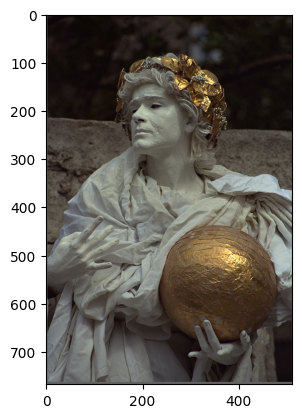

In [60]:
plt.imshow(im)
print(im.shape)

In [61]:
input_dim = 2
hidden_dim = 128
output_dim = 3
num_layers = 3
grid=20

model_fkan = FKAN_INR(in_features=input_dim , hidden_features=hidden_dim, out_features=output_dim, grid=grid)
model_adaptive_fkan = AdaptiveGridFKAN(in_dim=input_dim, hidden=hidden_dim, out_dim=output_dim, base_grid=grid)
model_siren = Siren(in_features=input_dim, out_features=output_dim, hidden_features=hidden_dim,
                  hidden_layers=3, outermost_linear=True)
model_siren.cuda()

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model_fkan.to(device)
model_adaptive_fkan.to(device)

from torchinfo import summary
summary(model_fkan, input_size=(1,2))
summary(model_adaptive_fkan, input_size=(1,2))


Layer (type:depth-idx)                   Output Shape              Param #
AdaptiveGridFKAN                         [1, 3]                    2
├─FKAN_INR: 1-1                          [1, 3]                    --
│    └─FKANLayer: 2-1                    [1, 128]                  --
│    │    └─FourierKANLayer: 3-1         [1, 128]                  10,368
│    │    └─LayerNorm: 3-2               [1, 128]                  256
│    └─SineLayer: 2-2                    [1, 256]                  --
│    │    └─Linear: 3-3                  [1, 256]                  33,024
│    └─SineLayer: 2-3                    [1, 256]                  --
│    │    └─Linear: 3-4                  [1, 256]                  65,792
│    └─SineLayer: 2-4                    [1, 256]                  --
│    │    └─Linear: 3-5                  [1, 256]                  65,792
│    └─SineLayer: 2-5                    [1, 512]                  --
│    │    └─Linear: 3-6                  [1, 512]                  13

In [62]:
args.steps_til_summary = 10
degree = 2
hidden = 256

# with multiplication
args.inr_model = 'kan'
#KAN ***************
# im = normalize(plt.imread(args.input).astype(np.float32), True)
# im = cv2.resize(im, (512, 512), interpolation=cv2.INTER_AREA)
# im = gaussian_pyramid[0]
H, W, _ = im.shape

args.niters = 100

args.using_schedular = True

def find_tiles(b_indices, H, W, grid_size=16):
  row_indices = b_indices // W
  col_indices = b_indices % W

  tile_row_indices = row_indices // grid_size
  tile_col_indices = col_indices // grid_size

  return tile_row_indices, tile_col_indices

coords = get_coords(H, W, dim=2)[None, ...]

gt = torch.tensor(im).reshape(H * W, 3)[None, ...].to(device)

rec = torch.zeros_like(gt)
def train(model, model_name='model'):
    best_loss = torch.tensor(float('inf'))
    psnr_values = []
    loss_history = []
    alpha_history = []
    mse_array = torch.zeros(args.niters, device=device)
    optim = torch.optim.Adam(lr=args.lr, params=model.parameters())
    scheduler = lr_scheduler.LambdaLR(optim, lambda x: args.scheduler_b ** min(x / args.niters, 1))
    for step in tqdm(range(args.niters)):
        indices = torch.randperm(H*W)

        N = indices.shape[0]
        for b_idx in range(0, min(H*W, len(indices)), args.maxpoints):
            b_indices = indices[b_idx:min(b_idx + args.maxpoints, len(indices))]
            b_coords = coords[:, b_indices, ...].to(device)
            b_indices = b_indices.to(device)

            if args.inr_model == 'ab' or model_name == 'model_siren':
                model_output, coef = model(b_coords)
            else:
                model_output = model(b_coords.squeeze(0))
                model_output = model_output.unsqueeze(0)

            with torch.no_grad():
                rec[:, b_indices, :] = model_output

            output_loss = ((model_output - gt[:, b_indices, :])**2).mean()

            if args.inr_model == 'ab':

                a_coef, b_coef, c_coef, d_coef = coef[0]
                reg_loss = args.a_coef * torch.relu(-a_coef) + \
                        args.b_coef * torch.relu(-b_coef) + \
                        args.c_coef * torch.relu(-c_coef) + \
                        args.d_coef * torch.relu(-d_coef)


                loss = output_loss + reg_loss
            else:
                loss = output_loss
            optim.zero_grad()
            loss.backward()
            optim.step()
        with torch.no_grad():
            mse_array[step] = ((gt - rec)**2).mean().item()
            loss_history.append(mse_array[step])
            psnr = -10*torch.log10(mse_array[step])
            psnr_values.append(psnr.item())
        if args.using_schedular:
            if args.inr_model == 'kan' and step > 30:
                scheduler.step()
            else:
                scheduler.step()
        imrec = rec[0, ...].reshape(H, W, 3).detach().cpu().numpy()
        if (mse_array[step] < best_loss) or (step == 0):
            best_loss = mse_array[step]
            best_img = imrec
            best_img = (best_img - best_img.min()) / (best_img.max() - best_img.min())
        if step % args.steps_til_summary == 0:
            print("Model: {} Epoch: {} | Total Loss: {:.5f} | PSNR: {:.4f}".format(model_name,step,
                                                                        mse_array[step].item(),
                                                                        psnr.item()))
            if model_name == 'adaptive_fkan':
                alpha_history.append(model.log_alpha.exp().detach().cpu().numpy().tolist())
                torch.save(alpha_history, model_name + '_alpha')
            _, axes = plt.subplots(1, 2, figsize=(6, 6))
            axes[0].set_title('Ground Truth')
            axes[0].imshow(im)
            axes[0].axis('off')
            axes[1].set_title('Reconstructed')
            axes[1].imshow(best_img)
            axes[1].axis('off')
            plt.show()
    print('--------------------')
    print('Max PSNR:', max(psnr_values))
    print('--------------------')
    torch.save(psnr_values, f'{model_name}_psnr.pt')
    torch.save(loss_history, f'{model_name}_loss.pt')
    torch.save(model.state_dict(), model_name)

# Train models

  0%|          | 0/100 [00:00<?, ?it/s]

Model: fkan Epoch: 0 | Total Loss: 0.00927 | PSNR: 20.3294


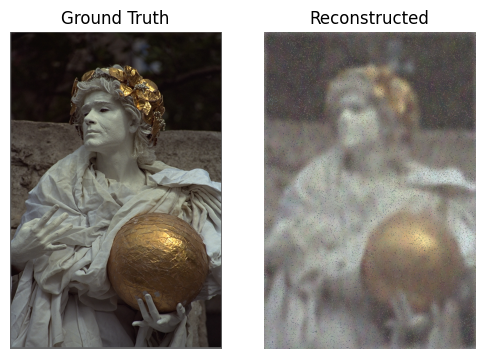

 10%|█         | 10/100 [00:08<01:09,  1.29it/s]

Model: fkan Epoch: 10 | Total Loss: 0.00191 | PSNR: 27.1898


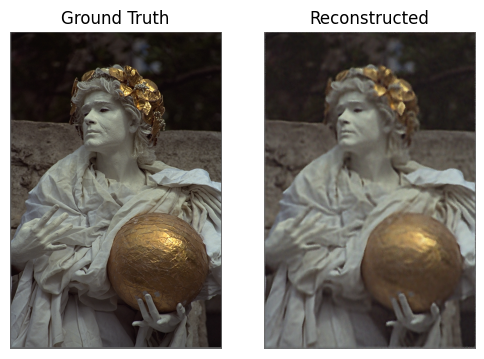

 20%|██        | 20/100 [00:15<01:01,  1.30it/s]

Model: fkan Epoch: 20 | Total Loss: 0.00145 | PSNR: 28.3772


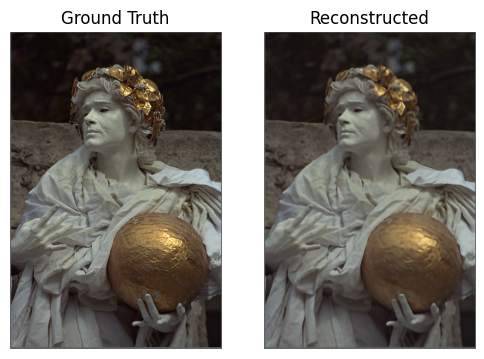

 30%|███       | 30/100 [00:23<00:54,  1.28it/s]

Model: fkan Epoch: 30 | Total Loss: 0.00121 | PSNR: 29.1730


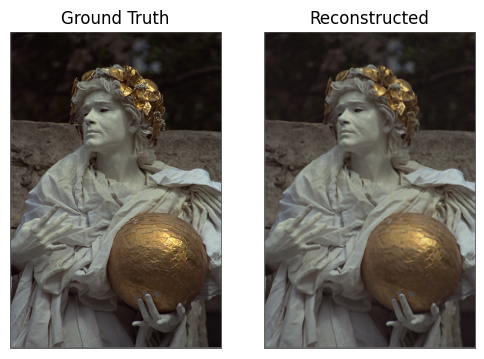

 40%|████      | 40/100 [00:31<00:47,  1.27it/s]

Model: fkan Epoch: 40 | Total Loss: 0.00100 | PSNR: 29.9818


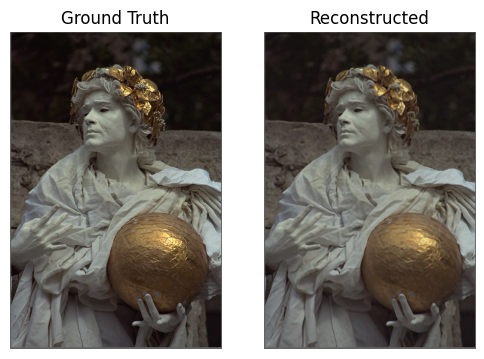

 50%|█████     | 50/100 [00:39<00:38,  1.28it/s]

Model: fkan Epoch: 50 | Total Loss: 0.00087 | PSNR: 30.6085


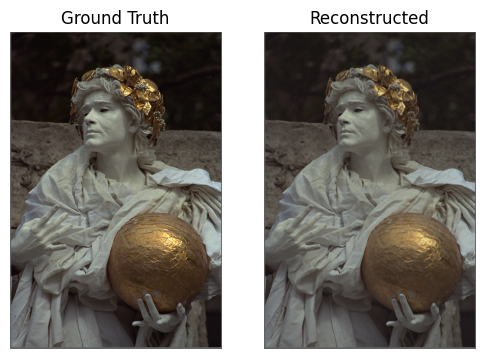

 60%|██████    | 60/100 [00:47<00:31,  1.29it/s]

Model: fkan Epoch: 60 | Total Loss: 0.00072 | PSNR: 31.4450


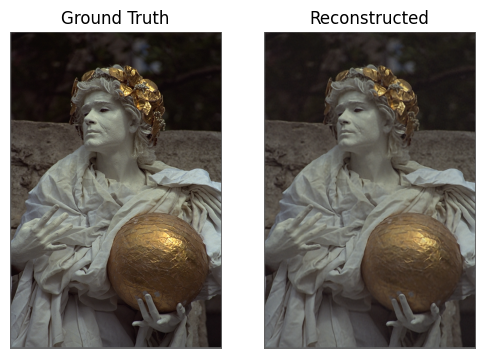

 70%|███████   | 70/100 [00:56<00:23,  1.29it/s]

Model: fkan Epoch: 70 | Total Loss: 0.00061 | PSNR: 32.1486


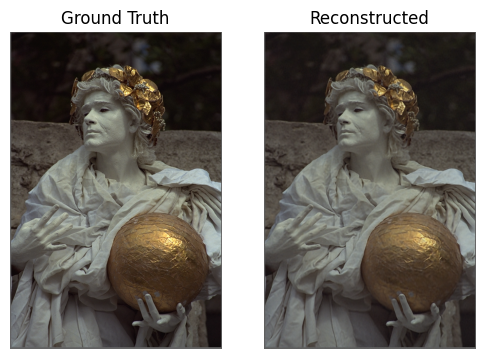

 80%|████████  | 80/100 [01:04<00:15,  1.31it/s]

Model: fkan Epoch: 80 | Total Loss: 0.00052 | PSNR: 32.8136


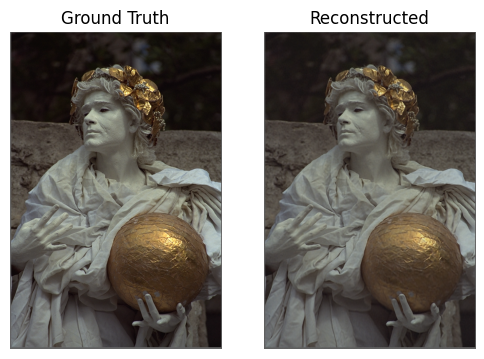

 90%|█████████ | 90/100 [01:11<00:07,  1.31it/s]

Model: fkan Epoch: 90 | Total Loss: 0.00045 | PSNR: 33.4557


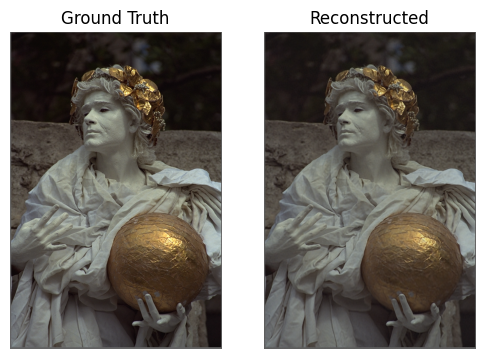

100%|██████████| 100/100 [01:19<00:00,  1.25it/s]


--------------------
Max PSNR: 33.95238494873047
--------------------


  0%|          | 0/100 [00:00<?, ?it/s]

Model: adaptive_fkan Epoch: 0 | Total Loss: 0.00824 | PSNR: 20.8397


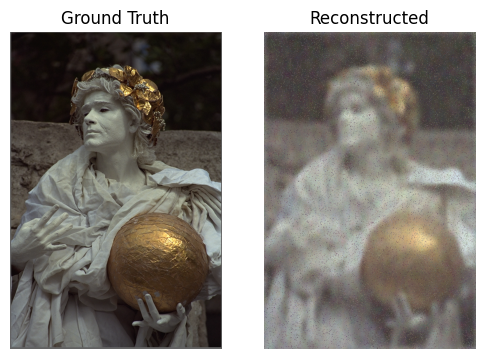

 10%|█         | 10/100 [00:09<01:23,  1.07it/s]

Model: adaptive_fkan Epoch: 10 | Total Loss: 0.00190 | PSNR: 27.2158


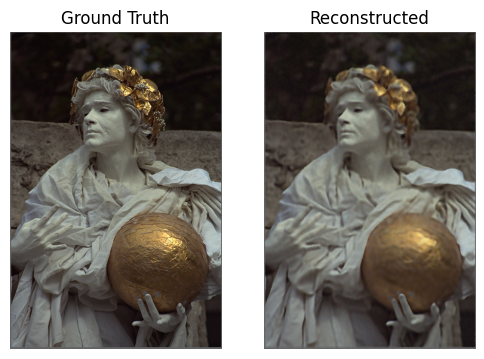

 20%|██        | 20/100 [00:19<01:14,  1.07it/s]

Model: adaptive_fkan Epoch: 20 | Total Loss: 0.00146 | PSNR: 28.3578


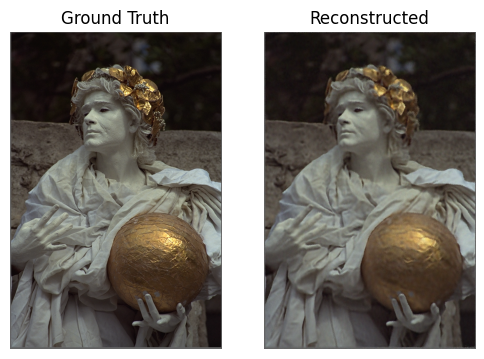

 30%|███       | 30/100 [00:28<01:05,  1.06it/s]

Model: adaptive_fkan Epoch: 30 | Total Loss: 0.00122 | PSNR: 29.1484


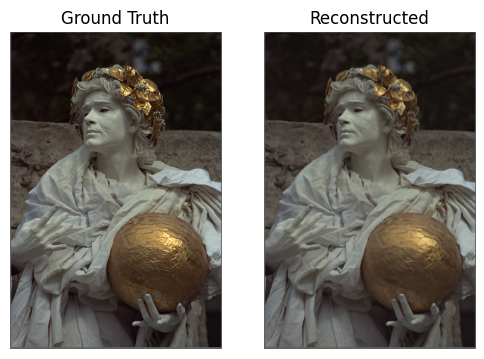

 40%|████      | 40/100 [00:38<00:56,  1.06it/s]

Model: adaptive_fkan Epoch: 40 | Total Loss: 0.00100 | PSNR: 29.9822


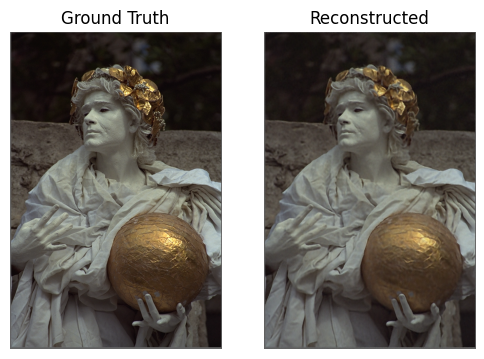

 50%|█████     | 50/100 [00:48<00:46,  1.07it/s]

Model: adaptive_fkan Epoch: 50 | Total Loss: 0.00083 | PSNR: 30.8085


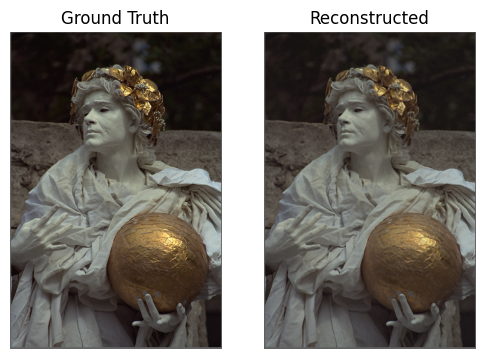

 60%|██████    | 60/100 [00:57<00:37,  1.07it/s]

Model: adaptive_fkan Epoch: 60 | Total Loss: 0.00071 | PSNR: 31.4882


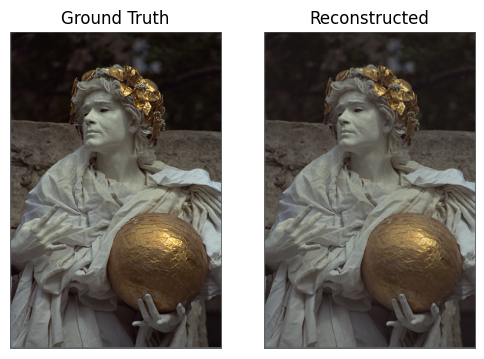

 70%|███████   | 70/100 [01:07<00:28,  1.07it/s]

Model: adaptive_fkan Epoch: 70 | Total Loss: 0.00060 | PSNR: 32.2298


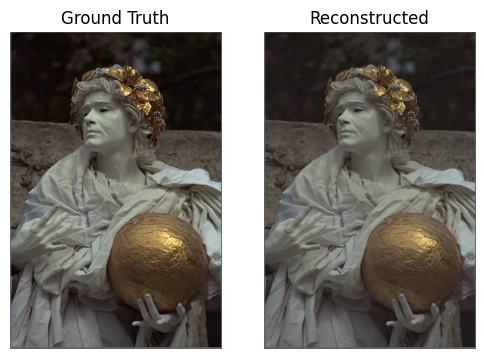

 80%|████████  | 80/100 [01:16<00:19,  1.05it/s]

Model: adaptive_fkan Epoch: 80 | Total Loss: 0.00051 | PSNR: 32.9293


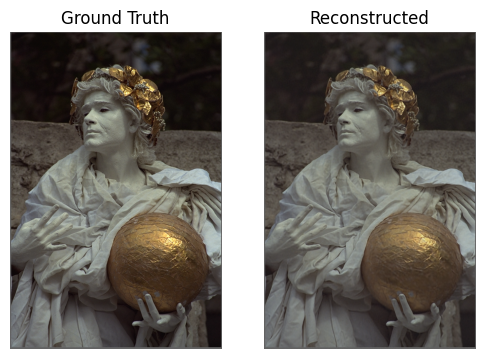

 90%|█████████ | 90/100 [01:27<00:11,  1.12s/it]

Model: adaptive_fkan Epoch: 90 | Total Loss: 0.00045 | PSNR: 33.4642


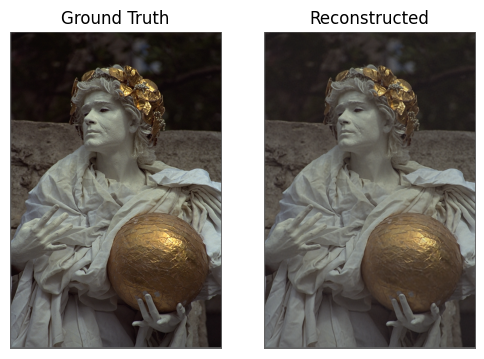

100%|██████████| 100/100 [01:37<00:00,  1.03it/s]


--------------------
Max PSNR: 33.97981262207031
--------------------


  0%|          | 0/100 [00:00<?, ?it/s]

Model: model_siren Epoch: 0 | Total Loss: 0.01747 | PSNR: 17.5775


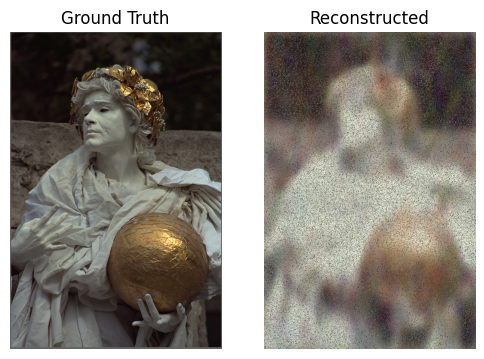

 10%|█         | 10/100 [00:03<00:33,  2.67it/s]

Model: model_siren Epoch: 10 | Total Loss: 0.00251 | PSNR: 26.0009


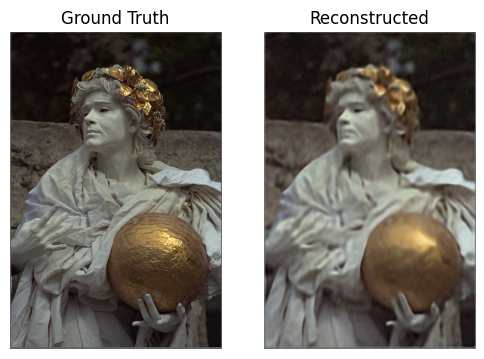

 20%|██        | 20/100 [00:07<00:24,  3.26it/s]

Model: model_siren Epoch: 20 | Total Loss: 0.00195 | PSNR: 27.0920


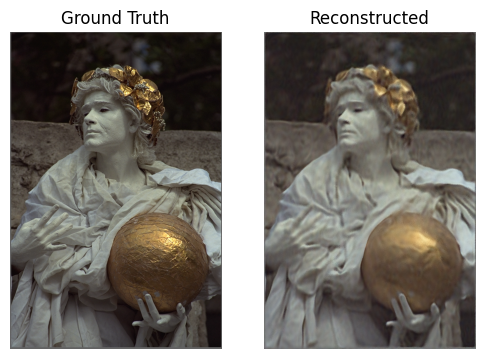

 30%|███       | 30/100 [00:10<00:21,  3.25it/s]

Model: model_siren Epoch: 30 | Total Loss: 0.00167 | PSNR: 27.7708


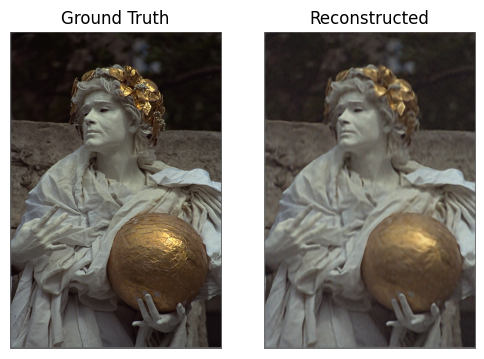

 40%|████      | 40/100 [00:13<00:18,  3.19it/s]

Model: model_siren Epoch: 40 | Total Loss: 0.00149 | PSNR: 28.2743


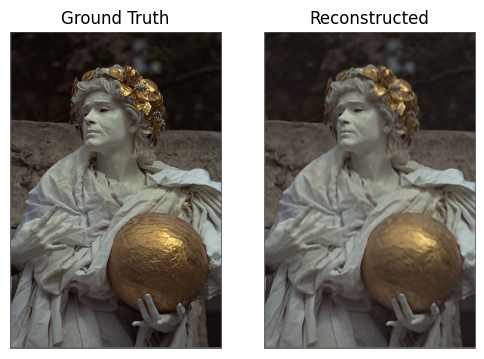

 50%|█████     | 50/100 [00:17<00:18,  2.72it/s]

Model: model_siren Epoch: 50 | Total Loss: 0.00137 | PSNR: 28.6177


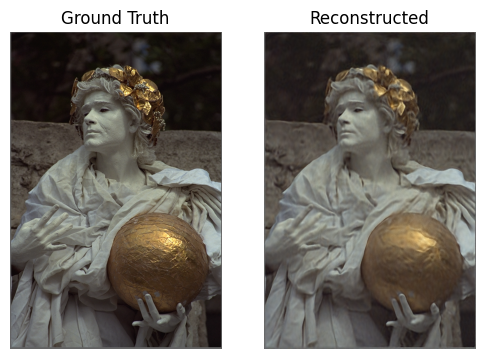

 60%|██████    | 60/100 [00:21<00:12,  3.23it/s]

Model: model_siren Epoch: 60 | Total Loss: 0.00129 | PSNR: 28.9068


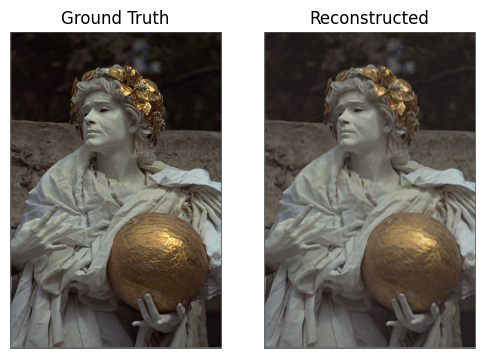

 70%|███████   | 70/100 [00:24<00:09,  3.27it/s]

Model: model_siren Epoch: 70 | Total Loss: 0.00121 | PSNR: 29.1676


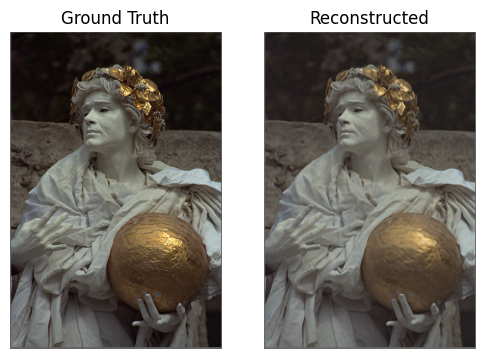

 80%|████████  | 80/100 [00:27<00:06,  2.91it/s]

Model: model_siren Epoch: 80 | Total Loss: 0.00116 | PSNR: 29.3723


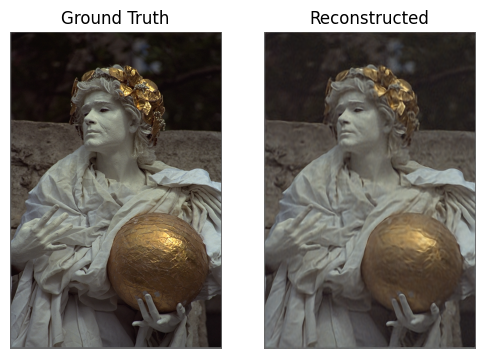

 90%|█████████ | 90/100 [00:31<00:03,  3.03it/s]

Model: model_siren Epoch: 90 | Total Loss: 0.00111 | PSNR: 29.5293


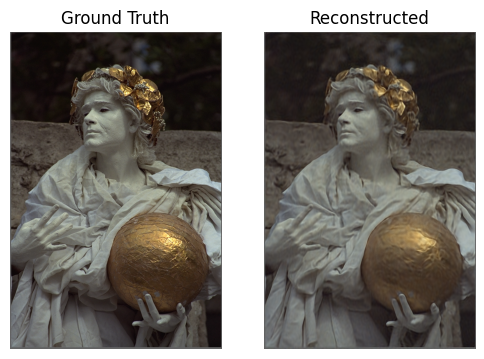

100%|██████████| 100/100 [00:35<00:00,  2.78it/s]

--------------------
Max PSNR: 29.664812088012695
--------------------


In [63]:
train(model_fkan, 'fkan')
train(model_adaptive_fkan, 'adaptive_fkan')
train(model_siren, 'model_siren')

# Reconstruct


In [64]:
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import mean_squared_error as loss
model1 = FKAN_INR(input_dim, hidden_dim, output_dim, grid).to(device)
model1.load_state_dict(torch.load('/content/fkan'), strict=False)

model2 = AdaptiveGridFKAN(input_dim, hidden_dim, output_dim, grid).to(device)
model2.load_state_dict(torch.load('/content/adaptive_fkan'), strict=False)

model_siren = Siren(in_features=input_dim, out_features=output_dim, hidden_features=hidden_dim,
                  hidden_layers=3, outermost_linear=True).to(device)
model_siren.load_state_dict(torch.load('/content/model_siren'), strict=False)

coords = get_coords(H, W, dim=2)[None, ...].squeeze(0)  # Shape: [H*W, 2]
coords = coords.to(device)

batch_size = 5000
imrec1, imrec2 = [], []

def reconstruct(model):
    model.eval()
    with torch.no_grad():
        out = []
        for i in range(0, coords.shape[0], batch_size):
            res = model(coords[i:i+batch_size])
            if isinstance(res, tuple):
                res = res[0]
            out.append(res.cpu())
    out = torch.cat(out, 0).numpy().reshape(H, W, 3).clip(0,1)
    return out


rec1 = reconstruct(model1)
rec2 = reconstruct(model2)
rec3 = reconstruct(model_siren)

## Analyze

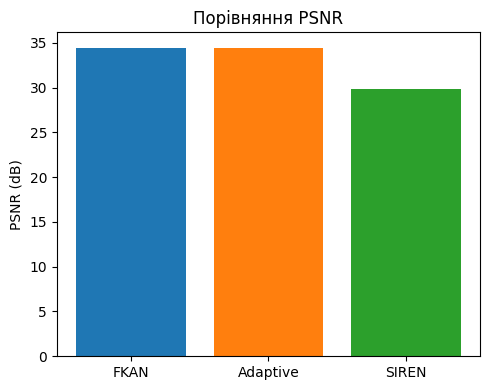

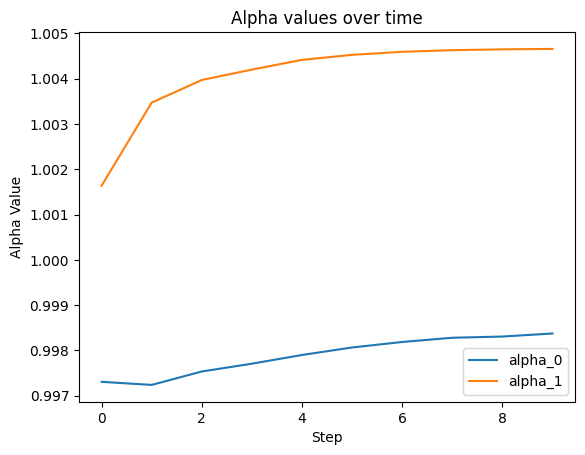

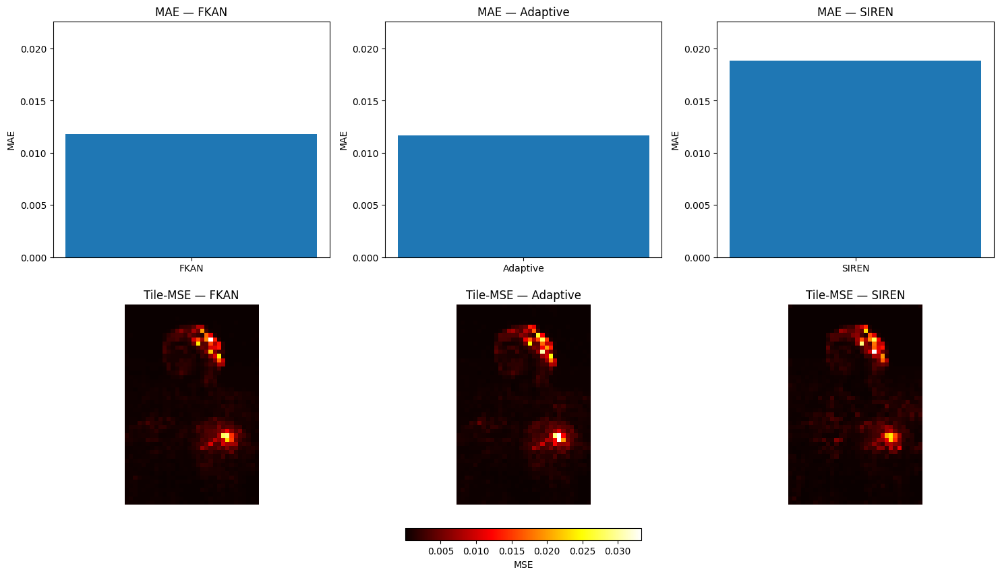

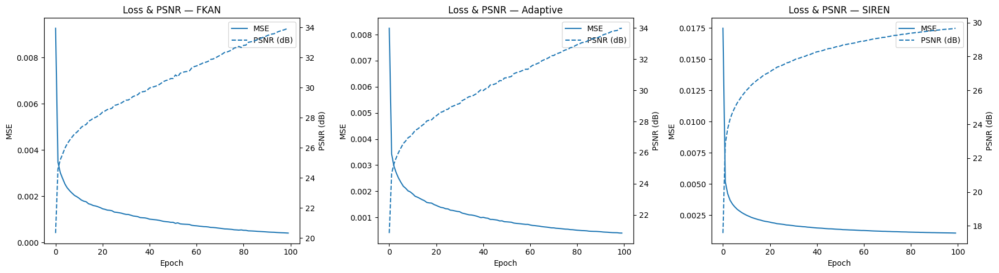

In [ ]:
psnr1 = psnr(im, rec1, data_range=1.0)
psnr2 = psnr(im, rec2, data_range=1.0)
psnr3 = psnr(im, rec3, data_range=1.0)

# PSNR
plt.figure(figsize=(5,4))
plt.bar(['FKAN','Adaptive', 'SIREN'], [psnr1, psnr2, psnr3], color=['C0','C1', 'C2'])
plt.ylabel('PSNR (dB)')
plt.title('PSNR comparison')
plt.tight_layout()
plt.show()

# Alpha history AdaptiveGridFKAN
alpha_history = torch.load('adaptive_fkan_alpha')

alpha_history_np = np.array(alpha_history)

for i in range(alpha_history_np.shape[1]):
    plt.plot(alpha_history_np[:, i], label=f'alpha_{i}')

plt.xlabel('Step')
plt.ylabel('Alpha Value')
plt.title('Alpha values over time')
plt.legend()
plt.show()

# MSE
maes = [
    np.mean(np.abs(im - rec1)),
    np.mean(np.abs(im - rec2)),
    np.mean(np.abs(im - rec3)),
]
models = ['FKAN', 'Adaptive', 'SIREN']

def compute_tile_mse(reconstruction, tile_size=16):
    diffs = (im - reconstruction) ** 2
    per_pixel_mse = diffs.mean(axis=2)
    n_rows, n_cols = H // tile_size, W // tile_size
    tile_mse = np.zeros((n_rows, n_cols))
    for i in range(n_rows):
        for j in range(n_cols):
            block = per_pixel_mse[
                i*tile_size:(i+1)*tile_size,
                j*tile_size:(j+1)*tile_size
            ]
            tile_mse[i, j] = block.mean()
    return tile_mse


tile_mses = [
    compute_tile_mse(rec1),
    compute_tile_mse(rec2),
    compute_tile_mse(rec3),
]

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

for i, ax in enumerate(axes[0]):
    ax.bar([models[i]], [maes[i]])
    ax.set_ylim(0, max(maes)*1.2)
    ax.set_title(f'MAE — {models[i]}')
    ax.set_ylabel('MAE')

for i, ax in enumerate(axes[1]):
    im_h = ax.imshow(tile_mses[i], cmap='hot', interpolation='nearest')
    ax.set_title(f'Tile-MSE — {models[i]}')
    ax.axis('off')

cbar = fig.colorbar(im_h, ax=axes[1, :], orientation='horizontal', fraction=0.05, pad=0.1)
cbar.set_label('MSE')

plt.show()
# LOSS VS PSNR
loss_history_fkan = torch.load('fkan_loss.pt')
psnr_history_fkan = torch.load('fkan_psnr.pt')

loss_history_adaptive = torch.load('adaptive_fkan_loss.pt')
psnr_history_adaptive = torch.load('adaptive_fkan_psnr.pt')

loss_history_siren = torch.load('model_siren_loss.pt')
psnr_history_siren = torch.load('model_siren_psnr.pt')


loss_history_fkan = torch.tensor(loss_history_fkan).cpu().numpy()
psnr_history_fkan = torch.tensor(psnr_history_fkan).cpu().numpy()

loss_history_adaptive = torch.tensor(loss_history_adaptive).cpu().numpy()
psnr_history_adaptive = torch.tensor(psnr_history_adaptive).cpu().numpy()

loss_history_siren = torch.tensor(loss_history_siren).cpu().numpy()
psnr_history_siren = torch.tensor(psnr_history_siren).cpu().numpy()

epochs = np.arange(len(loss_history_fkan))

fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharex=True)

for ax, losses, psnrs, name in zip(axes,
                                   [loss_history_fkan, loss_history_adaptive, loss_history_siren],
                                   [psnr_history_fkan, psnr_history_adaptive, psnr_history_siren],
                                   ['FKAN', 'Adaptive', 'SIREN']):
    ax2 = ax.twinx()

    l1 = ax.plot(epochs, losses, label='MSE')
    l2 = ax2.plot(epochs, psnrs, linestyle='--', label='PSNR (dB)')

    ax.set_xlabel('Epoch')
    ax.set_ylabel('MSE')
    ax2.set_ylabel('PSNR (dB)')
    ax.set_title(f'Loss & PSNR — {name}')

    lines = l1 + l2
    labels = [l.get_label() for l in lines]
    ax.legend(lines, labels, loc='upper right')

plt.tight_layout()
plt.show()